In [1]:
### Definining name of analysis ###
name = '2023-08-12_AirspeedCalibrationPost_June15_2022'
data_path = '../data/'
data_folder = 'createv-2022-06-15'
file_name = 'june15_2022.BIN'
datasave_path = data_path+data_folder+'/'
result_path = '../Results/'+name+'/'
figure_path = '../Figures/'+name+'/'

In [2]:
from os import sys
import os
sys.path.append('../')

# Getting packages #
%matplotlib widget

from matplotlib import pyplot as plt
from matplotlib.widgets import SpanSelector
import numpy as np
import pandas as pd
from scipy import optimize 
from scipy.io import savemat
import pandas as pd
import decimal
import math

import plotly.express as px

import main
from main import flight
from main import analysis
import propellers
import motors
from aircraft import airplane
import cl_finders

import data_exporter
import datetime

### Creating Folders for Results/Data ###
if not os.path.exists(result_path):
    os.makedirs(result_path)
if not os.path.exists(figure_path):
    os.makedirs(figure_path)

# Setting Plot Defaults
plt.style.use('../basic_plotter.mplstyle')

In [3]:
# Vehicle parameters
prop = propellers.aeronaut20x8() # Using aeronaut 20x8 for this flight
motor = motors.U7V2_280KV()  # Using U7 V2 motor

mass = 12.727 # Estimated with virtual bolt included
span = 6.28
chord = 0.395
createv = airplane(mass, chord, span)

P_systems = 4 # Amount of power consumed by everything except the ESC & motor

highorderpolar = True

In [4]:
# Importing data, specifying import characteristics, backing up results
rate = "10ms"
interpolateM = "linear"
processor = "CREATeV_2022"

rawdata_name = data_folder+'/'+file_name.split('.')[0]+'_'+rate+'_'+interpolateM+'_'+processor+'.pkl'

# Checking if the data is already pickled for analysis
if os.path.exists(data_path+rawdata_name):
    df = pd.read_pickle(data_path+rawdata_name)
else:
    df = main.get_data(processor, data_folder+'/'+file_name, rate)
    df = df.interpolate(method=interpolateM)
    pd.to_pickle(df, data_path+rawdata_name) # Storing parsed data

In [5]:
print(df.Airspeed[-1])
print(df.Airspeed[len(df)-1])
print(df.shape)
indices = np.arange(0, df.shape[0])
print(len(df.Airspeed))
print(indices.shape)

df["index_ref"] = indices

0.6034334897994995
0.6034334897994995
(1497703, 52)
1497703
(1497703,)


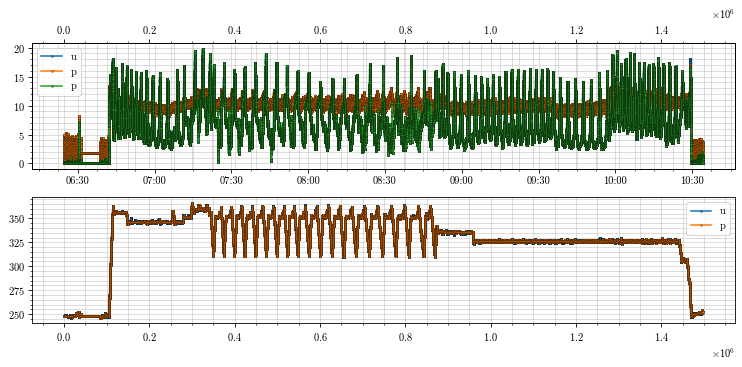

899777.953305744 956054.5355297374
899778 956054
9.251752339785785


1157574.9178273468 1228310.0928847173
1157575 1228310
9.094398160941164


In [6]:
## Generating Map Plots Descending ## 

token = "pk.eyJ1Ijoid2tlbXA5NCIsImEiOiJjbGI0NHJuemkwMmF2M29zM24xcTlpNXVjIn0.qSiAc29MftNSOK2DOpRggw"
color_scale = [(0, 'orange'), (1,'red')]

fig = plt.figure(figsize=(10,5), dpi=75)
ax1 = plt.subplot(2,1,1)
ax1.plot(df.index, df.Groundspeed_GPS)
ax2 = ax1.twiny()
ax2.plot(df.index_ref, df.Airspeed_Sensor0, label='Airspeed 0')
ax2.plot(df.index_ref, df.Airspeed_Sensor1, label='Airspeed 1')
ax2.plot(df.index_ref, df.Groundspeed_GPS, label='Ground speed')
ax2.legend("upper left")

ax3 = plt.subplot(2, 1, 2, sharex=ax2)
ax3.plot(df.index_ref, df.Altitude_GPS, label='GPS Altitude')
ax3.plot(df.index_ref, df.Altitude, label='Altitude')
ax3.legend("upper left")
plt.show()

def onselect(xmin, xmax):
    print(xmin, xmax)
    xmin = decimal.Decimal(xmin)
    xmin = math.ceil(xmin)
    xmin = round(xmin)

    xmax = decimal.Decimal(xmax)
    xmax = math.floor(xmax)
    xmax = round(xmax)
    print(xmin, xmax)

    df_sample = df.iloc[xmin:xmax]
    print(np.mean(df_sample.Airspeed_Sensor0))

    fig2 = px.scatter_mapbox(df_sample, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name=df_sample.index, 
                        #hover_data=["Address", "Listed"],
                        color="Airspeed_Sensor0",
                        color_continuous_scale='jet',
                        #size="Listed",
                        zoom=15.5, 
                        height=600,
                        width=900,
                        labels={"Airspeed": 'Airspeed (m/s)'},
                        center={'lat':44.0427, 'lon':-79.845},
                        template='presentation')
    fig2.update_layout(mapbox_style="satellite", mapbox_accesstoken=token)
    fig2.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    fig2.show()

    # Try plotting time on the x axis, and overplotting index as the real axis.  
    # 1. Generate plot of airspeeds vs the absolute index
    # 2. Create a dummy series showing the time index

span = SpanSelector(
    ax2,
    onselect,
    "horizontal",
    useblit=True,
    props=dict(alpha=0.5, facecolor="tab:blue"),
    interactive=True,
    drag_from_anywhere=True
)
# Set useblit=True on most backends for enhanced performance.

In [7]:
df.head(10)

,Altitude,DescendingXK,Airspeed,Latitude,Longitude,Altitude_TECS,Altitude_POS,Altitude_GPS,Altitude_Origin,Airspeed_CTUN,...,SolarChargerPower,SolarPanelVoltage,Cell1Voltage,Cell2Voltage,Cell3Voltage,Cell4Voltage,Cell5Voltage,Cell6Voltage,MainBatterymAh,index_ref
Time,,,,,,,,,,,,,,,,,,,,,
2022-06-15 06:24:36.920,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2022-06-15 06:24:36.930,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2022-06-15 06:24:36.940,NaN,NaN,6.483746e-23,NaN,NaN,NaN,NaN,NaN,NaN,6.483746e-23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
2022-06-15 06:24:36.950,NaN,-0.007695,6.483746e-23,NaN,NaN,NaN,NaN,NaN,NaN,6.483746e-23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
2022-06-15 06:24:36.960,248.139999,-0.009338,6.483746e-23,44.042058,-79.846511,NaN,248.139999,NaN,NaN,6.483746e-23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
2022-06-15 06:24:36.970,248.139999,-0.009035,6.483746e-23,44.042058,-79.846511,NaN,248.139999,NaN,NaN,6.483746e-23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
2022-06-15 06:24:36.980,248.139999,-0.008732,6.483746e-23,44.042058,-79.846511,NaN,248.139999,NaN,NaN,6.483746e-23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
2022-06-15 06:24:36.990,248.139999,-0.008430,6.483746e-23,44.042058,-79.846511,NaN,248.139999,NaN,NaN,6.483746e-23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7
2022-06-15 06:24:37.000,248.139999,-0.010171,6.483746e-23,44.042058,-79.846511,NaN,248.139999,NaN,NaN,6.483746e-23,...,0.0,0.02,4.129,4.165,4.165,4.155,4.155,4.155,0.0,8


/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_42650/1320444121.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_42650/1320444121.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_42650/1320444121.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

0 days 00:00:07.660000
0
0 days 00:00:05.700000
1
0 days 00:00:07.600000
2
0 days 00:05:06.010000
3
0 days 00:00:07.590000
4
0 days 00:00:09.840000
5
0 days 00:00:10.500000
6
0 days 00:04:43.490000
7
0 days 00:04:07.310000
8
0 days 00:00:03
9
0 days 00:01:54.960000
10
0 days 00:02:00.590000
11
0 days 00:00:06.710000
12
0 days 00:00:02.340000
13
0 days 00:00:08.060000
14
0 days 00:02:29.380000
15
0 days 00:00:06.300000
16
0 days 00:02:27.120000
17
0 days 00:00:04.340000
18
0 days 00:00:08.180000
19


Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substitutin

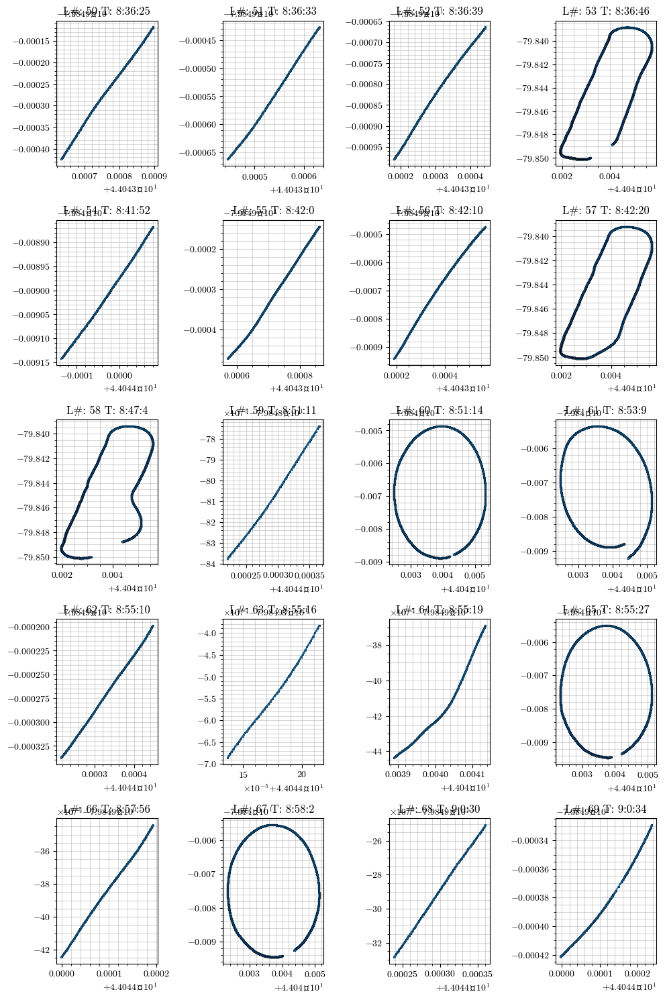

Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substitutin

In [42]:
range = 7 # Range of heading in degrees
heading_mask = (df["Heading"] < 180 + (range/2)) & (df["Heading"] > 180-(range/2))
heading_mask = heading_mask.replace({True: 1, False: 0})
edge_mask = heading_mask.diff(periods=1)
loiter_mask = (edge_mask == 1) # Mask with True for beginning of each loiter
loiter_times = loiter_mask.loc[loiter_mask == True] # Loiter Series storing loiter number, start time, end time. 

loiter_numbers = np.arange(50, 70) # Selecting the nth loiter of the flight for analysis

fig, axs = plt.subplots(int(np.ceil(loiter_numbers.size / 4)), 4)
axs = axs.flatten()

for i, loiter_number in enumerate(loiter_numbers):

    mask = cl_finders.mask_fromTime(df, loiter_times.index[loiter_number], loiter_times.index[loiter_number+1])
    segment = df[mask]
    segment["PowerElectrical"] = segment.EscVoltage * segment.EscCurrent

    durations = loiter_times.index.to_series().diff()
    print(durations[loiter_number+1])
    
    axs[i].plot(segment.Latitude, segment.Longitude)
    axs[i].set_title("L#: " + str(loiter_number) + " T: " + str(loiter_times.index[loiter_number].hour)+':'+str(loiter_times.index[loiter_number].minute)+':'+str(loiter_times.index[loiter_number].second))

    # Displaying Longitude/Lattitude for loiter
    # fig = px.scatter_mapbox(segment, 
    #                         lat="Latitude", 
    #                         lon="Longitude", 
    #                         hover_name=segment.index, 
    #                         #hover_data=["Address", "Listed"],
    #                         color="PowerElectrical",
    #                         color_continuous_scale='jet',
    #                         size="PowerElectrical",
    #                         zoom=15, 
    #                         height=500,
    #                         width=600)
    # fig.update_layout(mapbox_style="open-street-map")
    # fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    # fig.show()
    print(i)
fig.set_size_inches(10, 15)
plt.show()

## Developing the algorithm to sort out the loiter position (theta) from processed loiters

Selecting loiter 60 for testing on

### Steps:

1. Find the centroid of the loiter
   1. Find the maximum and minimum of the circle (lattitude and longitude)
   2. Take the midpoint between these to represent the centroid (not super complex)
2. Calculate the angle between the centroid and all sampled points in the loiter
   1. Numpy trigonometric functions (See equation below) tangent but with continuity taken into account

$ tan( \frac{y_p - y_0}{x_p - x_0}) = \theta $

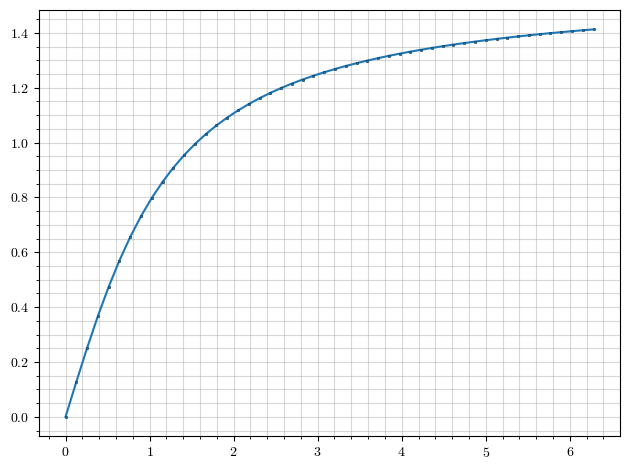

In [48]:
# Testing trig function to make sure that it'll work for all cases

x = np.linspace(0, 2 * np.pi)
y = np.arctan(x)

plt.figure()
plt.plot(x, y)
plt.show()

In [71]:
segment_test = 65

mask = cl_finders.mask_fromTime(df, loiter_times.index[segment_test], loiter_times.index[segment_test+1])
segment = df[mask]

lattitude = np.array(segment.Latitude)
longitude = np.array(segment.Longitude)

print(np.max(lattitude))
print(np.min(lattitude))

y0 = (np.max(lattitude) + np.min(lattitude)) * 0.5
x0 = (np.max(longitude) + np.min(longitude)) * 0.5

print(np.max(longitude))
print(np.min(longitude))

44.045127
44.0423257
-79.8455041
-79.8494568


Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\\times' [U+d7], substituting with a dummy symbol.


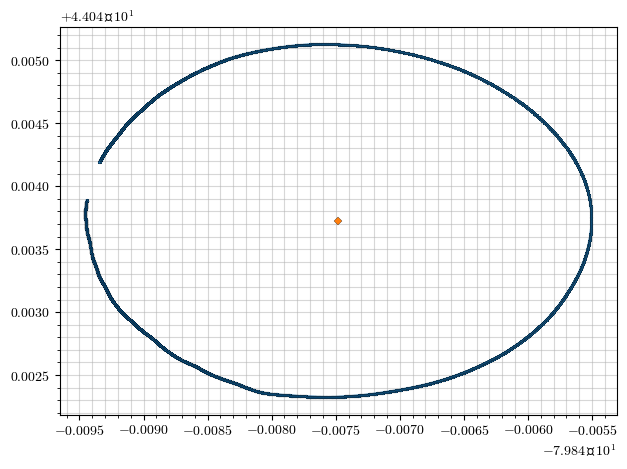

In [72]:
plt.figure()
plt.plot(longitude, lattitude)
plt.plot(x0, y0, marker='D')
plt.show()

In [73]:
x_diffs = longitude - x0
y_diffs = lattitude - y0

thetas = np.arctan2(y_diffs, x_diffs) * 180 / np.pi

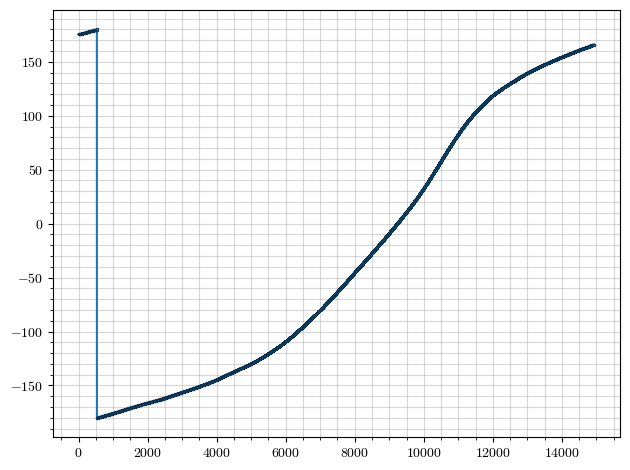

In [74]:
plt.figure()
plt.plot(thetas)
plt.show()

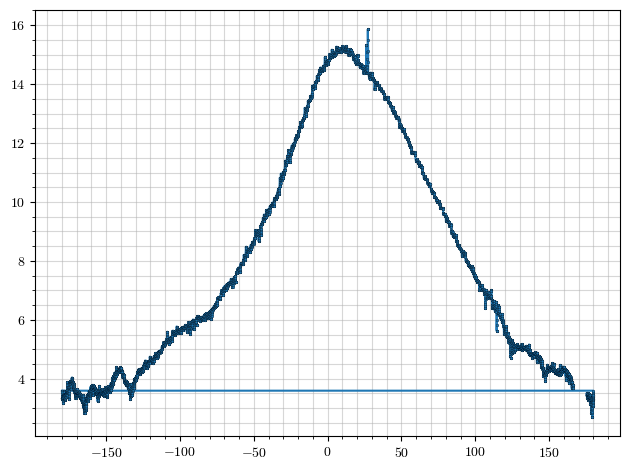

In [75]:
plt.figure()
plt.plot(thetas, segment.Groundspeed_GPS)
plt.show()